## HCP connectome dataset PCA properties

In [1]:
import numpy as np
import os
import pandas as pd
import matplotlib.pyplot as plt
import scipy
import sklearn
from sklearn.decomposition import PCA
import torch
from torch.utils.data import Dataset, DataLoader
from data.data_utils import *
from mpl_toolkits.axes_grid1 import make_axes_locatable

In [2]:
import importlib
import data.hcp_dataset
import data.dataset_utils 
import data.data_utils
importlib.reload(data.hcp_dataset)
importlib.reload(data.dataset_utils)
importlib.reload(data.data_utils)
from data.hcp_dataset import *
from data.dataset_utils import *
from data.data_utils import *
from data.hcp_dataset import HCP_Base, HCP_Partition

### Load data

In [3]:
HCP_Dataset = HCP_Base(parcellation="Glasser", shuffle_seed=0)

Extract data into np arrays for local analysis

In [6]:
HCP_train = HCP_Partition(HCP_Dataset, "train")
HCP_val = HCP_Partition(HCP_Dataset, "val")
HCP_test = HCP_Partition(HCP_Dataset, "test")

HCP_train_loader = DataLoader(HCP_train, batch_size=64, shuffle=True)
HCP_val_loader = DataLoader(HCP_val, batch_size=64, shuffle=True)
HCP_test_loader = DataLoader(HCP_test, batch_size=64, shuffle=True)

sc_train_matrices = HCP_Dataset.sc_upper_triangles[HCP_train.indices]
sc_train_avg = HCP_Dataset.sc_train_avg
sc_val_matrices = HCP_Dataset.sc_upper_triangles[HCP_val.indices]
sc_val_avg = np.mean(sc_val_matrices, axis=0)
sc_test_matrices = HCP_Dataset.sc_upper_triangles[HCP_test.indices]
sc_test_avg = np.mean(sc_test_matrices, axis=0)

fc_train_matrices = HCP_Dataset.fc_upper_triangles[HCP_train.indices]
fc_train_avg = HCP_Dataset.fc_train_avg
fc_val_matrices = HCP_Dataset.fc_upper_triangles[HCP_val.indices]
fc_val_avg = np.mean(fc_val_matrices, axis=0)
fc_test_matrices = HCP_Dataset.fc_upper_triangles[HCP_test.indices]
fc_test_avg = np.mean(fc_test_matrices, axis=0)

SC Train vs Val Pearson r: 0.9983357056068822
SC Train vs Test Pearson r: 0.9991294663581596
SC Val vs Test Pearson r: 0.9979011787466777


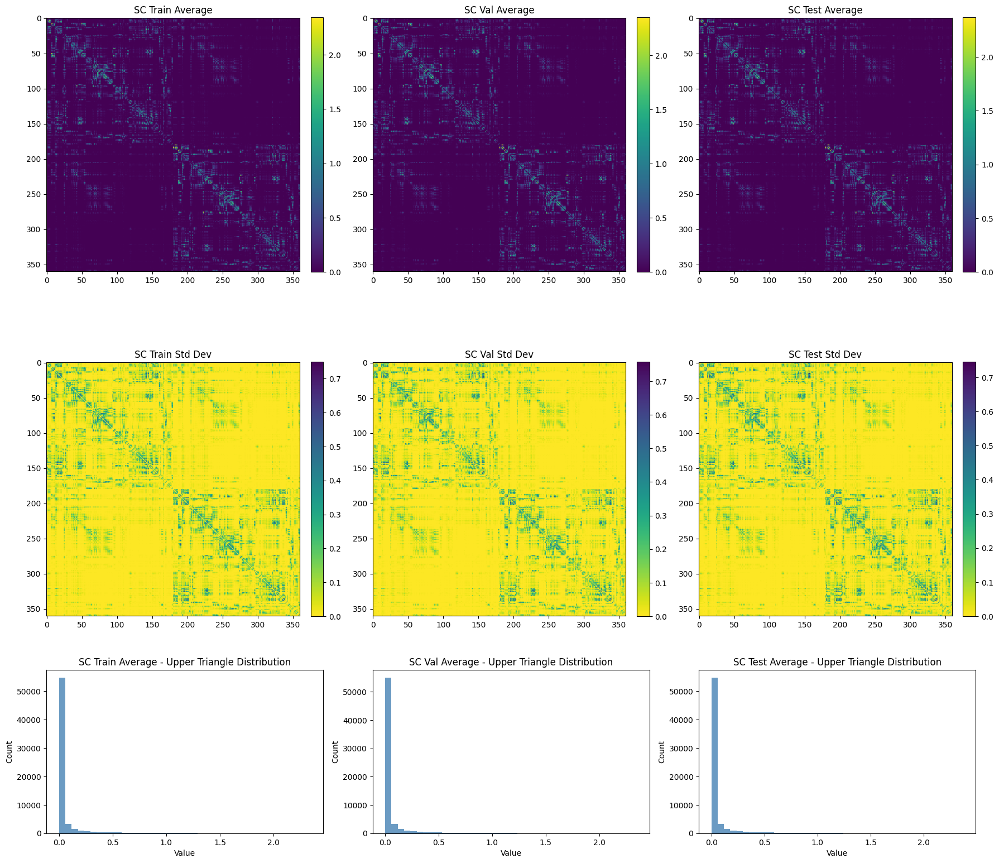

FC Train vs Val Pearson r: 0.9964534436294099
FC Train vs Test Pearson r: 0.9980708636132108
FC Val vs Test Pearson r: 0.9947440464581221


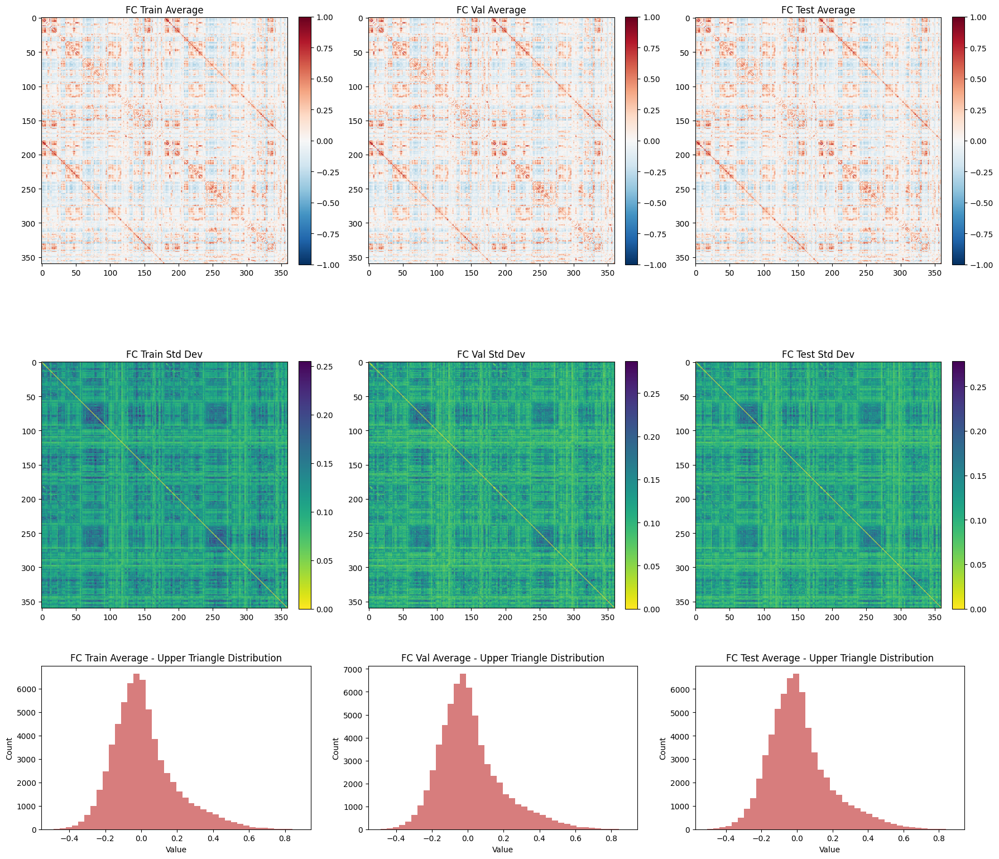

In [7]:
# Plot average and stddev SC matrices for train, val, test splits using tri2square
sc_tri_indices = np.triu_indices(360, k=1)
sc_train_avg_mat = tri2square(sc_train_avg, tri_indices=sc_tri_indices)
sc_val_avg_mat = tri2square(sc_val_avg, tri_indices=sc_tri_indices)
sc_test_avg_mat = tri2square(sc_test_avg, tri_indices=sc_tri_indices)

# Also compute standard deviation matrices for each split
sc_train_std = np.std(sc_train_matrices, axis=0)
sc_val_std = np.std(sc_val_matrices, axis=0)
sc_test_std = np.std(sc_test_matrices, axis=0)
sc_train_std_mat = tri2square(sc_train_std, tri_indices=sc_tri_indices)
sc_val_std_mat = tri2square(sc_val_std, tri_indices=sc_tri_indices)
sc_test_std_mat = tri2square(sc_test_std, tri_indices=sc_tri_indices)

print("SC Train vs Val Pearson r:", tri_corr(sc_train_avg_mat, sc_val_avg_mat))
print("SC Train vs Test Pearson r:", tri_corr(sc_train_avg_mat, sc_test_avg_mat))
print("SC Val vs Test Pearson r:", tri_corr(sc_val_avg_mat, sc_test_avg_mat))

# PLOT: avg, stddev imshow and histogram for each SC split
fig, axs = plt.subplots(3, 3, figsize=(18, 16), gridspec_kw={'height_ratios': [2, 2, 1]})
sc_avg_mats = [sc_train_avg_mat, sc_val_avg_mat, sc_test_avg_mat]
sc_std_mats = [sc_train_std_mat, sc_val_std_mat, sc_test_std_mat]
sc_titles = ["SC Train", "SC Val", "SC Test"]

for i, (avgmat, stdmat, title) in enumerate(zip(sc_avg_mats, sc_std_mats, sc_titles)):
    # Row 0: average imshow
    im1 = axs[0, i].imshow(avgmat, aspect='equal', cmap='viridis')
    axs[0, i].set_title(f"{title} Average")
    fig.colorbar(im1, ax=axs[0, i], fraction=0.046, pad=0.04)
    # Row 1: stddev imshow
    im2 = axs[1, i].imshow(stdmat, aspect='equal', cmap='viridis_r')
    axs[1, i].set_title(f"{title} Std Dev")
    fig.colorbar(im2, ax=axs[1, i], fraction=0.046, pad=0.04)
    # Row 2: Histogram of upper triangle (excluding diagonal) from average matrix
    iu = np.triu_indices_from(avgmat, k=1)
    axs[2, i].hist(avgmat[iu], bins=40, color='steelblue', alpha=0.8)
    axs[2, i].set_xlabel('Value')
    axs[2, i].set_ylabel('Count')
    axs[2, i].set_title(f'{title} Average - Upper Triangle Distribution')
plt.tight_layout()
plt.show()

# Plot average and stddev FC matrices for train, val, test splits using tri2square
fc_tri_indices = np.triu_indices(360, k=1)
fc_train_avg_mat = tri2square(fc_train_avg, tri_indices=fc_tri_indices)
fc_val_avg_mat = tri2square(fc_val_avg, tri_indices=fc_tri_indices)
fc_test_avg_mat = tri2square(fc_test_avg, tri_indices=fc_tri_indices)

# Also compute standard deviation matrices for each split
fc_train_std = np.std(fc_train_matrices, axis=0)
fc_val_std = np.std(fc_val_matrices, axis=0)
fc_test_std = np.std(fc_test_matrices, axis=0)
fc_train_std_mat = tri2square(fc_train_std, tri_indices=fc_tri_indices)
fc_val_std_mat = tri2square(fc_val_std, tri_indices=fc_tri_indices)
fc_test_std_mat = tri2square(fc_test_std, tri_indices=fc_tri_indices)

# Print the similarity (Pearson correlation) between each pair of average FCs
print("FC Train vs Val Pearson r:", tri_corr(fc_train_avg_mat, fc_val_avg_mat))
print("FC Train vs Test Pearson r:", tri_corr(fc_train_avg_mat, fc_test_avg_mat))
print("FC Val vs Test Pearson r:", tri_corr(fc_val_avg_mat, fc_test_avg_mat))

# PLOT: avg, stddev imshow and histogram for each FC split
fig, axs = plt.subplots(3, 3, figsize=(18, 16), gridspec_kw={'height_ratios': [2, 2, 1]})
fc_avg_mats = [fc_train_avg_mat, fc_val_avg_mat, fc_test_avg_mat]
fc_std_mats = [fc_train_std_mat, fc_val_std_mat, fc_test_std_mat]
fc_titles = ["FC Train", "FC Val", "FC Test"]

for i, (avgmat, stdmat, title) in enumerate(zip(fc_avg_mats, fc_std_mats, fc_titles)):
    # Row 0: average imshow
    im1 = axs[0, i].imshow(avgmat, aspect='equal', cmap='RdBu_r', vmin=-1, vmax=1)
    axs[0, i].set_title(f"{title} Average")
    fig.colorbar(im1, ax=axs[0, i], fraction=0.046, pad=0.04)
    # Row 1: stddev imshow
    im2 = axs[1, i].imshow(stdmat, aspect='equal', cmap='viridis_r')
    axs[1, i].set_title(f"{title} Std Dev")
    fig.colorbar(im2, ax=axs[1, i], fraction=0.046, pad=0.04)
    # Row 2: Histogram of upper triangle (excluding diagonal) from average matrix
    iu = np.triu_indices_from(avgmat, k=1)
    axs[2, i].hist(avgmat[iu], bins=40, color='indianred', alpha=0.8)
    axs[2, i].set_xlabel('Value')
    axs[2, i].set_ylabel('Count')
    axs[2, i].set_title(f'{title} Average - Upper Triangle Distribution')
plt.tight_layout()
plt.show()

In [28]:
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.cross_decomposition import PLSRegression
from scipy.stats import pearsonr, spearmanr
from sklearn.decomposition import PCA
from scipy import stats

def fit_pca(X):
    print('X.shape:', X.shape)
    pca = PCA(n_components=min(X.shape))
    pca.fit(X)

    B = pca.components_ # loadings i.e. orthonormal basis vectors (d by k)
    print('B.shape:', B.shape)
    print('B orthonormal:', np.allclose(B @ B.T, np.eye(B.shape[0]), atol=1e-6))
    C = pca.transform(X) # scores (n by k)
    print('C.shape:', C.shape)

    variance_explained = pca.explained_variance_ratio_
    cumulative_variance_explained = np.cumsum(variance_explained)

    return B, C, variance_explained, cumulative_variance_explained

def plot_pca_variance(variance_explained, cumulative_variance_explained=None, var_threshold=0.95, 
                      marker_size=2, max_components_for_bar=100, modality=None, parcellation=None):
    """
    Plot explained variance per PCA component and cumulative variance.
    If cumulative_variance_explained is not provided, will compute from variance_explained.
    Args:
        variance_explained: array-like, explained variance ratio for each PC.
        cumulative_variance_explained: array-like or None; will compute if None.
        var_threshold: float, cumulative variance threshold to annotate (default 0.95).
        marker_size: int, markersize for lines.
        max_components_for_bar: int, max number of bars to show for per-component chart.
        modality: str or None; e.g. "SC", for title.
        parcellation: str or None; e.g. "Glasser", for title.
    """
    if cumulative_variance_explained is None:
        cumulative_variance_explained = np.cumsum(variance_explained)

    num_components = len(variance_explained)
    components = np.arange(1, num_components + 1)
    n_components_to_plot = min(max_components_for_bar, num_components)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))

    # Left plot: cumulative variance
    ax1.plot(components, cumulative_variance_explained, marker="o", markersize=marker_size, color="blue", label="Cumulative Variance Explained")
    k_thresh = np.searchsorted(cumulative_variance_explained, var_threshold) + 1
    ax1.axhline(var_threshold, color='red', linestyle='--',
                label=f'{int(var_threshold*100)}% Variance (n_comps={k_thresh})')
    ax1.set_xlabel("Number of components")
    ax1.set_ylabel("Cumulative explained variance ratio")
    ax1.set_title("Cumulative Variance Explained")
    ax1.grid(True)
    ax1.legend()

    # Right plot: variance per component as bar chart
    ax2.bar(components[:n_components_to_plot], variance_explained[:n_components_to_plot], 
            alpha=0.7, color='slateblue', edgecolor='black', linewidth=0.5, label='Variance Explained')
    ax2.set_xlabel("Component number")
    ax2.set_ylabel("Explained variance ratio")
    ax2.set_title(f"Variance Explained per Component (first {n_components_to_plot})")
    ax2.grid(True, alpha=0.3, axis='y')

    plt.tight_layout()
    plt.show()


def run_pca_and_plot(X_train, X_val=None, X_test=None, 
                     train_ids=None, val_ids=None, test_ids=None,
                     modality="SC", parcellation="Glasser",
                     var_threshold=0.95, marker_size=2, random_state=None,
                     max_components_for_bar=100, reconstruct_and_plot=True):
    """
    Run PCA on the input train data X_train, print shape info, and plot cumulative explained variance.
    Additionally, computes and plots reconstruction R^2 for training, validation, and test datasets 
    using PCA fit on training data. Also, reconstruct and output for all subjects with error bands.

    Args:
        X_train (np.ndarray): Training data of shape (n_train_samples, n_features).
        X_val (np.ndarray or None): Validation data of shape (n_val_samples, n_features).
        X_test (np.ndarray or None): Test data of shape (n_test_samples, n_features).
        train_ids (list of str/int, optional): Subject IDs for train set.
        val_ids (list of str/int, optional): Subject IDs for val set.
        test_ids (list of str/int, optional): Subject IDs for test set.
        modality (str): Modality name (e.g., "SC", "FC"). Default: "SC".
        parcellation (str): Parcellation name (e.g., "Glasser", "S456"). Default: "Glasser".
        var_threshold (float): The cumulative variance threshold to annotate.
        marker_size (int): Marker size for the plot points.
        random_state (int or None): Random seed used for reproducibility.
        max_components_for_bar (int): Maximum number of components to show in bar chart.
        reconstruct_and_plot (bool): Whether to reconstruct and plot the PCA results.
    Returns:
        pca (PCA object): The fitted PCA object.
        scores_dict (dict): Contains 'train', 'val', 'test' scores.
        loadings (np.ndarray): The PCA loadings (n_components x n_features).
    """
    np.random.seed(random_state)

    # Fit PCA on the training set only
    pca = PCA()
    train_scores = pca.fit_transform(X_train)
    loadings = pca.components_

    print("Loadings shape (n_components, n_features):", loadings.shape)
    print("Train scores shape (n_train_samples, n_components):", train_scores.shape)

    # Plot 1: Side-by-side cumulative and per-component variance
    cumvar = np.cumsum(pca.explained_variance_ratio_)
    var_per_comp = pca.explained_variance_ratio_
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 4))
    
    # Left: Cumulative variance
    ax1.plot(np.arange(1, len(cumvar) + 1), cumvar, marker="o", markersize=marker_size)
    k_thresh = np.searchsorted(cumvar, var_threshold) + 1
    ax1.axhline(var_threshold, color='red', linestyle='--',
                label=f'{int(var_threshold*100)}% Variance (n_comps={k_thresh})')
    ax1.set_xlabel("Number of components")
    ax1.set_ylabel("Cumulative explained variance ratio")
    ax1.set_title("Cumulative Variance Explained")
    ax1.grid(True)
    ax1.legend()
    
    # Right: Per-component variance (bar chart)
    n_components_to_plot = min(max_components_for_bar, len(var_per_comp))
    ax2.bar(np.arange(1, n_components_to_plot + 1), var_per_comp[:n_components_to_plot], 
            alpha=0.7, color='steelblue', edgecolor='black', linewidth=0.5)
    ax2.set_xlabel("Component number")
    ax2.set_ylabel("Explained variance ratio")
    ax2.set_title(f"Variance Explained per Component (first {n_components_to_plot})")
    ax2.grid(True, alpha=0.3, axis='y')
    
    plt.suptitle(f"Cumulative Variance Explained by PCA: {modality} ({parcellation})", fontsize=14, y=1.02)
    plt.tight_layout()
    plt.show()

    if reconstruct_and_plot:
        # Compute R^2 for different numbers of principal components for train/val/test using train PCA
        ks = np.array([16, 64, 128, 256, 512])
        r2s = {'train': [], 'val': [], 'test': []}

        # Helper for reconstruction
        def reconstruct(pca, scores, n_components):
            loadings_k = pca.components_[:n_components, :]
            return np.dot(scores[:, :n_components], loadings_k) + pca.mean_

        # Train set
        for k in ks:
            X_hat_train = reconstruct(pca, train_scores, k)
            r2_train = r2_score(X_train, X_hat_train, multioutput='uniform_average')
            r2s['train'].append(r2_train)

        # Validation set
        if X_val is not None:
            val_scores = pca.transform(X_val)
            for k in ks:
                X_hat_val = reconstruct(pca, val_scores, k)
                r2_val = r2_score(X_val, X_hat_val, multioutput='uniform_average')
                r2s['val'].append(r2_val)
        else:
            r2s['val'] = None

        # Test set
        if X_test is not None:
            test_scores = pca.transform(X_test)
            for k in ks:
                X_hat_test = reconstruct(pca, test_scores, k)
                r2_test_ = r2_score(X_test, X_hat_test, multioutput='uniform_average')
                r2s['test'].append(r2_test_)
        else:
            r2s['test'] = None

        # Print results for key values
        for special_k in [128, 256, 512]:
            if special_k in ks:
                idx = list(ks).index(special_k)
                line = f"{special_k} components: "
                line += f"Train R^2: {r2s['train'][idx]:.5f}  "
                if r2s['val'] is not None:
                    line += f"Val R^2: {r2s['val'][idx]:.5f}  "
                if r2s['test'] is not None:
                    line += f"Test R^2: {r2s['test'][idx]:.5f}"
                print(line)

        # Plot 3: Individualized reconstruction with error bands for ALL subjects
        def compute_all_subject_r2s(X, scores, pca, ks):
            """
            Compute R^2 for all subjects across different k values.
            Reconstructions are computed vectorized for all subjects at once.
            """
            n_subjects = X.shape[0]
            n_ks = len(ks)
            r2s_all = np.zeros((n_subjects, n_ks))
            
            # Compute reconstructions and R^2 for each k value
            for k_idx, k in enumerate(ks):
                # Reconstruct all subjects at once: (n_subjects, k) @ (k, n_features) -> (n_subjects, n_features)
                X_hat = np.dot(scores[:, :k], loadings[:k, :]) + pca.mean_
                
                # Compute R^2 per subject (vectorized)
                # R^2 = 1 - (SS_res / SS_tot) for each subject
                ss_res = np.sum((X - X_hat) ** 2, axis=1)  # (n_subjects,)
                ss_tot = np.sum((X - X.mean(axis=0, keepdims=True)) ** 2, axis=1)  # (n_subjects,)
                r2s_all[:, k_idx] = 1 - (ss_res / (ss_tot + 1e-10))  # Add small epsilon to avoid division by zero
            
            return r2s_all

        plt.figure(figsize=(9, 6))
        colors = {'train': 'navy', 'val': 'darkorange', 'test': 'forestgreen'}
        
        # Compute R^2 for all subjects in each split
        if X_train is not None:
            r2s_train_all = compute_all_subject_r2s(X_train, train_scores, pca, ks)
            means_train = np.mean(r2s_train_all, axis=0)
            stds_train = np.std(r2s_train_all, axis=0)
            # 95% confidence interval (using t-distribution)
            n_train = r2s_train_all.shape[0]
            ci_train = stats.t.interval(0.95, n_train - 1, loc=means_train, scale=stds_train / np.sqrt(n_train))
            ci_train_lower = ci_train[0]
            ci_train_upper = ci_train[1]
            
            plt.plot(ks, means_train, 'o-', label='Train', color=colors['train'], linewidth=2, markersize=8)
            plt.fill_between(ks, ci_train_lower, ci_train_upper, alpha=0.2, color=colors['train'])
        
        if X_val is not None and val_ids is not None:
            val_scores = pca.transform(X_val)
            r2s_val_all = compute_all_subject_r2s(X_val, val_scores, pca, ks)
            means_val = np.mean(r2s_val_all, axis=0)
            stds_val = np.std(r2s_val_all, axis=0)
            n_val = r2s_val_all.shape[0]
            ci_val = stats.t.interval(0.95, n_val - 1, loc=means_val, scale=stds_val / np.sqrt(n_val))
            ci_val_lower = ci_val[0]
            ci_val_upper = ci_val[1]
            
            plt.plot(ks, means_val, 'o-', label='Validation', color=colors['val'], linewidth=2, markersize=8)
            plt.fill_between(ks, ci_val_lower, ci_val_upper, alpha=0.2, color=colors['val'])
        
        if X_test is not None and test_ids is not None:
            test_scores = pca.transform(X_test)
            r2s_test_all = compute_all_subject_r2s(X_test, test_scores, pca, ks)
            means_test = np.mean(r2s_test_all, axis=0)
            stds_test = np.std(r2s_test_all, axis=0)
            n_test = r2s_test_all.shape[0]
            ci_test = stats.t.interval(0.95, n_test - 1, loc=means_test, scale=stds_test / np.sqrt(n_test))
            ci_test_lower = ci_test[0]
            ci_test_upper = ci_test[1]
            
            plt.plot(ks, means_test, 'o-', label='Test', color=colors['test'], linewidth=2, markersize=8)
            plt.fill_between(ks, ci_test_lower, ci_test_upper, alpha=0.2, color=colors['test'])
        
        plt.xlabel("Number of PCA components", fontsize=12)
        plt.ylabel("Individual $R^2$ (true vs reconstructed)", fontsize=12)
        plt.title(f"PCA Reconstruction $R^2$ Across All Subjects: {modality} ({parcellation})\n(Mean ± 95% Confidence Interval)", fontsize=13)
        plt.grid(True, alpha=0.3)
        plt.legend(fontsize=11)
        plt.tight_layout()
        plt.show()

        # Plot 4: Pearson correlation with error bands for ALL subjects
        def compute_all_subject_pearsonr(X, scores, pca, ks):
            """
            Compute Pearson correlation for all subjects across different k values.
            Reconstructions are computed vectorized for all subjects at once.
            """
            n_subjects = X.shape[0]
            n_ks = len(ks)
            pearsonr_all = np.zeros((n_subjects, n_ks))
            
            # Compute reconstructions and Pearson correlation for each k value
            for k_idx, k in enumerate(ks):
                # Reconstruct all subjects at once: (n_subjects, k) @ (k, n_features) -> (n_subjects, n_features)
                X_hat = np.dot(scores[:, :k], loadings[:k, :]) + pca.mean_
                
                # Compute Pearson correlation per subject (vectorized)
                # Center the data
                X_centered = X - X.mean(axis=1, keepdims=True)
                X_hat_centered = X_hat - X_hat.mean(axis=1, keepdims=True)
                
                # Compute correlation: r = sum((X - X_mean) * (X_hat - X_hat_mean)) / sqrt(sum((X - X_mean)^2) * sum((X_hat - X_hat_mean)^2))
                numerator = np.sum(X_centered * X_hat_centered, axis=1)  # (n_subjects,)
                denom_X = np.sqrt(np.sum(X_centered ** 2, axis=1))  # (n_subjects,)
                denom_X_hat = np.sqrt(np.sum(X_hat_centered ** 2, axis=1))  # (n_subjects,)
                pearsonr_all[:, k_idx] = numerator / (denom_X * denom_X_hat + 1e-10)  # Add small epsilon to avoid division by zero
            
            return pearsonr_all

        plt.figure(figsize=(9, 6))
        colors = {'train': 'navy', 'val': 'darkorange', 'test': 'forestgreen'}
        
        # Compute Pearson correlation for all subjects in each split
        if X_train is not None:
            pearsonr_train_all = compute_all_subject_pearsonr(X_train, train_scores, pca, ks)
            means_train = np.mean(pearsonr_train_all, axis=0)
            stds_train = np.std(pearsonr_train_all, axis=0)
            # 95% confidence interval (using t-distribution)
            n_train = pearsonr_train_all.shape[0]
            ci_train = stats.t.interval(0.95, n_train - 1, loc=means_train, scale=stds_train / np.sqrt(n_train))
            ci_train_lower = ci_train[0]
            ci_train_upper = ci_train[1]
            
            plt.plot(ks, means_train, 'o-', label='Train', color=colors['train'], linewidth=2, markersize=8)
            plt.fill_between(ks, ci_train_lower, ci_train_upper, alpha=0.2, color=colors['train'])
        
        if X_val is not None and val_ids is not None:
            val_scores = pca.transform(X_val)
            pearsonr_val_all = compute_all_subject_pearsonr(X_val, val_scores, pca, ks)
            means_val = np.mean(pearsonr_val_all, axis=0)
            stds_val = np.std(pearsonr_val_all, axis=0)
            n_val = pearsonr_val_all.shape[0]
            ci_val = stats.t.interval(0.95, n_val - 1, loc=means_val, scale=stds_val / np.sqrt(n_val))
            ci_val_lower = ci_val[0]
            ci_val_upper = ci_val[1]
            
            plt.plot(ks, means_val, 'o-', label='Validation', color=colors['val'], linewidth=2, markersize=8)
            plt.fill_between(ks, ci_val_lower, ci_val_upper, alpha=0.2, color=colors['val'])
        
        if X_test is not None and test_ids is not None:
            test_scores = pca.transform(X_test)
            pearsonr_test_all = compute_all_subject_pearsonr(X_test, test_scores, pca, ks)
            means_test = np.mean(pearsonr_test_all, axis=0)
            stds_test = np.std(pearsonr_test_all, axis=0)
            n_test = pearsonr_test_all.shape[0]
            ci_test = stats.t.interval(0.95, n_test - 1, loc=means_test, scale=stds_test / np.sqrt(n_test))
            ci_test_lower = ci_test[0]
            ci_test_upper = ci_test[1]
            
            plt.plot(ks, means_test, 'o-', label='Test', color=colors['test'], linewidth=2, markersize=8)
            plt.fill_between(ks, ci_test_lower, ci_test_upper, alpha=0.2, color=colors['test'])
        
        plt.xlabel("Number of PCA components", fontsize=12)
        plt.ylabel("Pearson $r$ (true vs reconstructed)", fontsize=12)
        plt.title(f"PCA Reconstruction Pearson Correlation Across All Subjects: {modality} ({parcellation})\n(Mean ± 95% Confidence Interval)", fontsize=13)
        plt.grid(True, alpha=0.3)
        plt.legend(fontsize=11)
        plt.tight_layout()
        plt.show()

        # Plot 5: Demeaned correlation with error bands for ALL subjects
        # This evaluates how well we match non-mean patterns at individual subject level
        def compute_all_subject_demeaned_corr(X, scores, pca, ks):
            """
            Compute demeaned correlation for all subjects across different k values.
            Correlation is computed between (X_subj - μ_train) and (X̂_subj - μ_train), 
            where μ_train is the training set mean (pca.mean_).
            This evaluates how well we capture deviations from the training mean pattern.
            """
            n_subjects = X.shape[0]
            n_ks = len(ks)
            demeaned_corr_all = np.zeros((n_subjects, n_ks))
            
            # Training set mean (used for demeaning all splits)
            mu_train = pca.mean_  # (n_features,) - mean computed from training data only
            
            # Compute reconstructions and demeaned correlation for each k value
            for k_idx, k in enumerate(ks):
                # Reconstruct all subjects at once: (n_subjects, k) @ (k, n_features) -> (n_subjects, n_features)
                X_hat = np.dot(scores[:, :k], loadings[:k, :]) + mu_train
                
                # Demean both original and reconstructed data by subtracting training set mean
                X_demeaned = X - mu_train  # (n_subjects, n_features)
                X_hat_demeaned = X_hat - mu_train  # (n_subjects, n_features)
                
                # Compute correlation per subject (vectorized)
                # r = sum((X - μ_train) * (X_hat - μ_train)) / sqrt(sum((X - μ_train)^2) * sum((X_hat - μ_train)^2))
                numerator = np.sum(X_demeaned * X_hat_demeaned, axis=1)  # (n_subjects,)
                denom_X = np.sqrt(np.sum(X_demeaned ** 2, axis=1))  # (n_subjects,)
                denom_X_hat = np.sqrt(np.sum(X_hat_demeaned ** 2, axis=1))  # (n_subjects,)
                demeaned_corr_all[:, k_idx] = numerator / (denom_X * denom_X_hat + 1e-10)  # Add small epsilon to avoid division by zero
            
            return demeaned_corr_all

        plt.figure(figsize=(9, 6))
        colors = {'train': 'navy', 'val': 'darkorange', 'test': 'forestgreen'}
        
        # Compute demeaned correlation for all subjects in each split
        if X_train is not None:
            demeaned_corr_train_all = compute_all_subject_demeaned_corr(X_train, train_scores, pca, ks)
            means_train = np.mean(demeaned_corr_train_all, axis=0)
            stds_train = np.std(demeaned_corr_train_all, axis=0)
            # 95% confidence interval (using t-distribution)
            n_train = demeaned_corr_train_all.shape[0]
            ci_train = stats.t.interval(0.95, n_train - 1, loc=means_train, scale=stds_train / np.sqrt(n_train))
            ci_train_lower = ci_train[0]
            ci_train_upper = ci_train[1]
            
            plt.plot(ks, means_train, 'o-', label='Train', color=colors['train'], linewidth=2, markersize=8)
            plt.fill_between(ks, ci_train_lower, ci_train_upper, alpha=0.2, color=colors['train'])
        
        if X_val is not None and val_ids is not None:
            val_scores = pca.transform(X_val)
            demeaned_corr_val_all = compute_all_subject_demeaned_corr(X_val, val_scores, pca, ks)
            means_val = np.mean(demeaned_corr_val_all, axis=0)
            stds_val = np.std(demeaned_corr_val_all, axis=0)
            n_val = demeaned_corr_val_all.shape[0]
            ci_val = stats.t.interval(0.95, n_val - 1, loc=means_val, scale=stds_val / np.sqrt(n_val))
            ci_val_lower = ci_val[0]
            ci_val_upper = ci_val[1]
            
            plt.plot(ks, means_val, 'o-', label='Validation', color=colors['val'], linewidth=2, markersize=8)
            plt.fill_between(ks, ci_val_lower, ci_val_upper, alpha=0.2, color=colors['val'])
        
        if X_test is not None and test_ids is not None:
            test_scores = pca.transform(X_test)
            demeaned_corr_test_all = compute_all_subject_demeaned_corr(X_test, test_scores, pca, ks)
            means_test = np.mean(demeaned_corr_test_all, axis=0)
            stds_test = np.std(demeaned_corr_test_all, axis=0)
            n_test = demeaned_corr_test_all.shape[0]
            ci_test = stats.t.interval(0.95, n_test - 1, loc=means_test, scale=stds_test / np.sqrt(n_test))
            ci_test_lower = ci_test[0]
            ci_test_upper = ci_test[1]
            
            plt.plot(ks, means_test, 'o-', label='Test', color=colors['test'], linewidth=2, markersize=8)
            plt.fill_between(ks, ci_test_lower, ci_test_upper, alpha=0.2, color=colors['test'])
        
        plt.xlabel("Number of PCA components", fontsize=12)
        plt.ylabel("Demeaned Pearson $r$ ($X_{subj} - \\mu_{train}$ vs $\\hat{X}_{subj} - \\mu_{train}$)", fontsize=12)
        plt.title(f"PCA Reconstruction Demeaned Correlation Across All Subjects: {modality} ({parcellation})\n(Mean ± 95% Confidence Interval)", fontsize=13)
        plt.grid(True, alpha=0.3)
        plt.legend(fontsize=11)
        plt.tight_layout()
        plt.show()

        return pca, {'train': train_scores, 'val': (pca.transform(X_val) if X_val is not None else None), 'test': (pca.transform(X_test) if X_test is not None else None)}, loadings



=== Running PCA for SC Train ===
X.shape: (683, 64620)
B.shape: (683, 64620)
B orthonormal: True
C.shape: (683, 683)


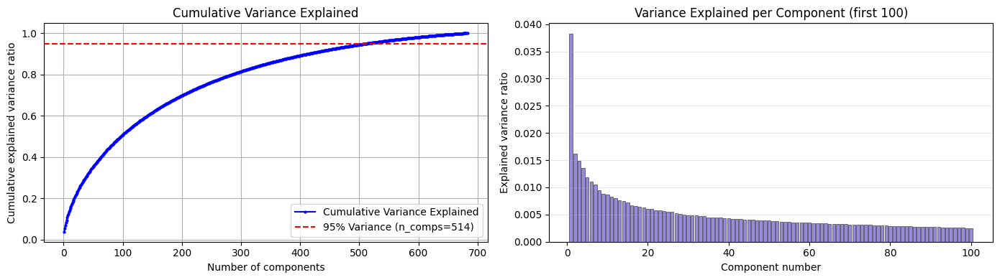


=== Running PCA for SC Val ===
X.shape: (79, 64620)
B.shape: (79, 64620)
B orthonormal: True
C.shape: (79, 79)


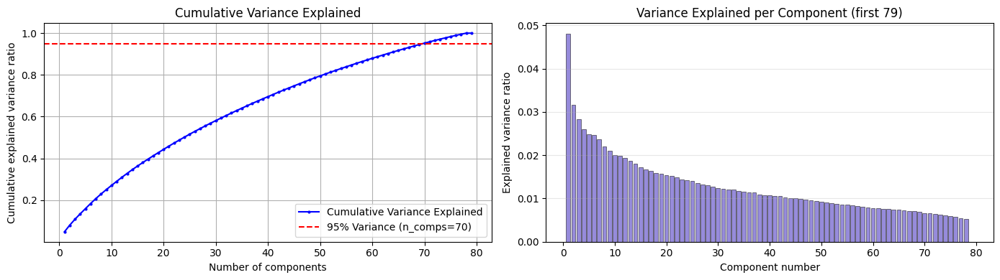


=== Running PCA for SC Test ===
X.shape: (195, 64620)
B.shape: (195, 64620)
B orthonormal: True
C.shape: (195, 195)


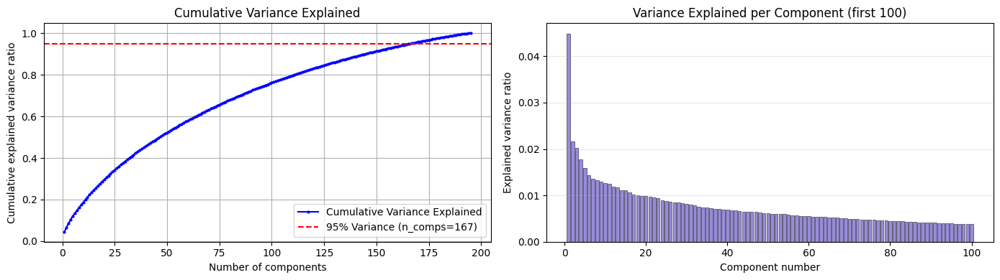


=== Running PCA for FC Train ===
X.shape: (683, 64620)
B.shape: (683, 64620)
B orthonormal: True
C.shape: (683, 683)


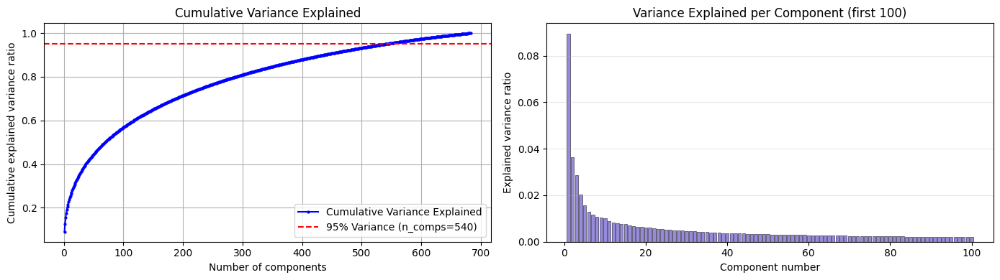


=== Running PCA for FC Val ===
X.shape: (79, 64620)
B.shape: (79, 64620)
B orthonormal: True
C.shape: (79, 79)


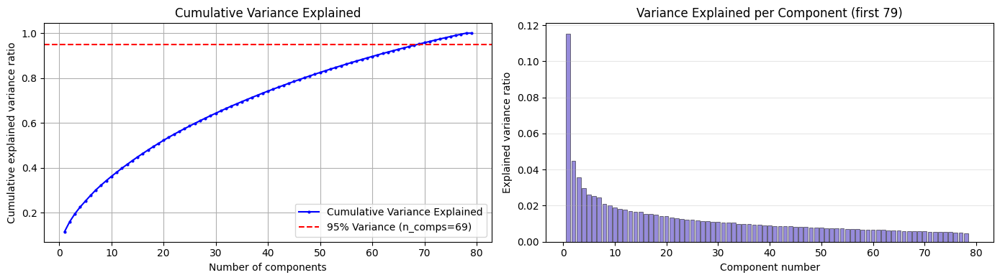


=== Running PCA for FC Test ===
X.shape: (195, 64620)
B.shape: (195, 64620)
B orthonormal: True
C.shape: (195, 195)


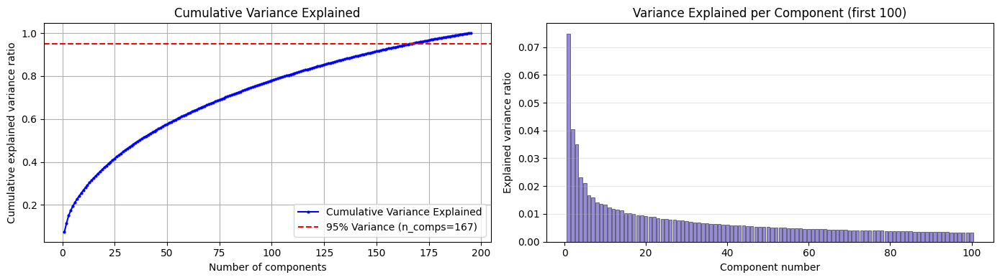

In [27]:
# For SC train, val, test:
for split_name, X in zip(
    ["Train", "Val", "Test"], 
    [sc_train_matrices, sc_val_matrices, sc_test_matrices]
):
    print(f"\n=== Running PCA for SC {split_name} ===")
    B, C, variance_explained, cumulative_variance_explained = fit_pca(X)
    plot_pca_variance(variance_explained, cumulative_variance_explained)

# For FC train, val, test:
for split_name, X in zip(
    ["Train", "Val", "Test"], 
    [fc_train_matrices, fc_val_matrices, fc_test_matrices]
):
    print(f"\n=== Running PCA for FC {split_name} ===")
    B, C, variance_explained, cumulative_variance_explained = fit_pca(X)
    plot_pca_variance(variance_explained, cumulative_variance_explained)

### Define edge-wise and subject-wise PCA

In [8]:
import models
import importlib
importlib.reload(models)
from models import *

In [ ]:
from mpl_toolkits.axes_grid1 import make_axes_locatable

def plot_pc_loadings_and_connectomes(
    B, train_matrices, tri2square, tri_indices,
    pc_to_observe=0, n_display=3, connectome_type="sc"
):
    """
    Plots the loadings of the selected principal component and visualizes the connectomes
    for the subjects with the highest and lowest loadings along that component.

    Args:
        B: PCA components/weights matrix (n_components x n_subjects).
        train_matrices: Connectome matrix (n_subjects x n_edges).
        tri2square: Function to convert vectorized connectome to square matrix.
        sc_tri_indices: Indices in upper triangle for matrix rebuild.
        pc_to_observe: Integer, which principal component to observe (0-indexed).
        n_display: Integer, number of subjects to display for connectome visualization.
        connectome_type: str, "sc" (structural) or "fc" (functional); controls colormap.
    """
    # Choose colormap based on connectome type
    if connectome_type.lower() == "sc":
        connectome_cmap = "viridis"
    elif connectome_type.lower() == "fc":
        connectome_cmap = "RdBu_r"
    else:
        connectome_cmap = "RdBu_r"

    selected_pc = B[pc_to_observe, :]

    # Bar plot of PC loadings
    plt.figure(figsize=(10, 5))
    plt.bar(np.arange(len(selected_pc)), selected_pc, color='steelblue', width=1.0, align='center', edgecolor='none')
    plt.xlabel("Subject Index")
    plt.ylabel(f"Principal Component {pc_to_observe + 1} Loading")
    plt.title(f"Principal Component {pc_to_observe + 1} Loadings (Subject-wise PCA)")
    plt.xlim(-0.5, len(selected_pc) - 0.5)
    plt.tight_layout()
    plt.show()

    # Plot the connectomes for the subjects with top PC loadings
    top_subjects = np.argsort(selected_pc)[-n_display:][::-1]  # Indices of top n highest loadings

    fig, axes = plt.subplots(1, n_display, figsize=(3.6 * n_display, 4), constrained_layout=False)
    if n_display == 1:
        axes = [axes]
    for i, subj_idx in enumerate(top_subjects):
        connectome = train_matrices[subj_idx, :]
        conn_mat = tri2square(connectome, tri_indices)
        im = axes[i].imshow(conn_mat, aspect='equal', cmap=connectome_cmap)
        axes[i].set_title(f"Top {i + 1} (Subj {subj_idx})", fontsize=12)
        axes[i].axis("off")
        divider = make_axes_locatable(axes[i])
        cax = divider.append_axes("right", size="5%", pad=0.10)
        cbar = plt.colorbar(im, cax=cax, label="Connectome Value")
    fig.suptitle(f"Connectomes: Top {n_display} Subjects by PC{pc_to_observe + 1} Loading")
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    # Plot the connectomes for the subjects with bottom PC loadings
    bottom_subjects = np.argsort(selected_pc)[:n_display]  # Indices of n lowest loadings

    fig, axes = plt.subplots(1, n_display, figsize=(3.6 * n_display, 4), constrained_layout=False)
    if n_display == 1:
        axes = [axes]
    for i, subj_idx in enumerate(bottom_subjects):
        connectome = train_matrices[subj_idx, :]
        conn_mat = tri2square(connectome, tri_indices=sc_tri_indices)
        im = axes[i].imshow(conn_mat, aspect='equal', cmap=connectome_cmap)
        axes[i].set_title(f"Bottom {i + 1} (Subj {subj_idx})", fontsize=12)
        axes[i].axis("off")
        divider = make_axes_locatable(axes[i])
        cax = divider.append_axes("right", size="5%", pad=0.10)
        cbar = plt.colorbar(im, cax=cax, label="Connectome Value")
    fig.suptitle(f"Connectomes: Bottom {n_display} Subjects by PC{pc_to_observe + 1} Loading")
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

#### SC evaluation

edge-wise

X.shape: (683, 64620)
B.shape: (683, 64620)
B orthonormal: True
C.shape: (683, 683)


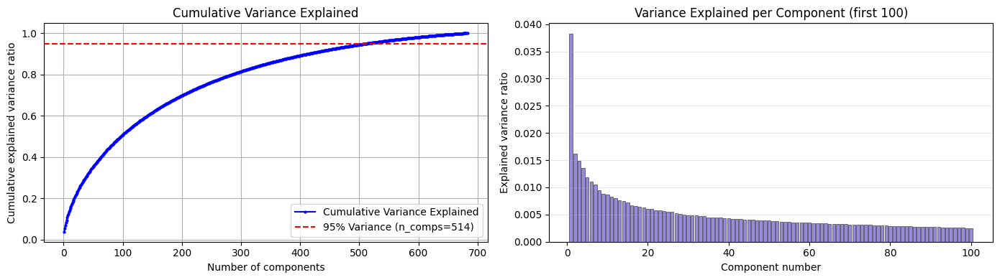

In [10]:
X = sc_train_matrices # n by d
B, C, variance_explained, cumulative_variance_explained = fit_pca(X)
plot_pca_variance(variance_explained, cumulative_variance_explained)

In the standard n by d case, PCA constructs an orthonormal basis of the data (B of shape d by k) that captures principal directions of variance in the edges across subjects. 100 PCs are required to explain 50% of the variance and 514 components to describe 95% of the variance, pointing towards nuanced layers of the covariance structure across edges in the connectome. Given that population variance tends to occur in the backbone of the population average connectome, we visualize the first PC, expecting larger weights in the backbone of the connectome.

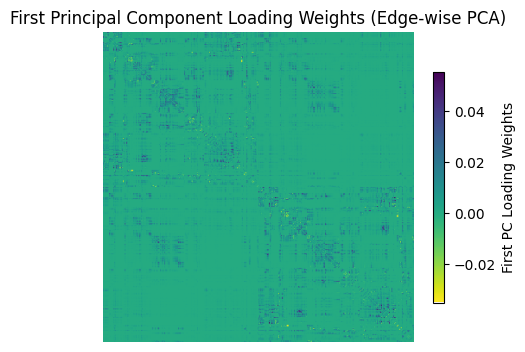

In [11]:
# Visualize the first PC loadings as a square matrix
first_pc = B[0, :]
pc_matrix = tri2square(first_pc, tri_indices=sc_tri_indices)
plt.figure(figsize=(5, 5))
im = plt.imshow(pc_matrix, cmap='viridis_r')
cbar = plt.colorbar(im, label="First PC Loading Weights", shrink=0.6)
plt.title("First Principal Component Loading Weights (Edge-wise PCA)")
plt.axis("off")
plt.show()

subject-wise

X.shape: (64620, 683)
B.shape: (683, 683)
B orthonormal: True
C.shape: (64620, 683)


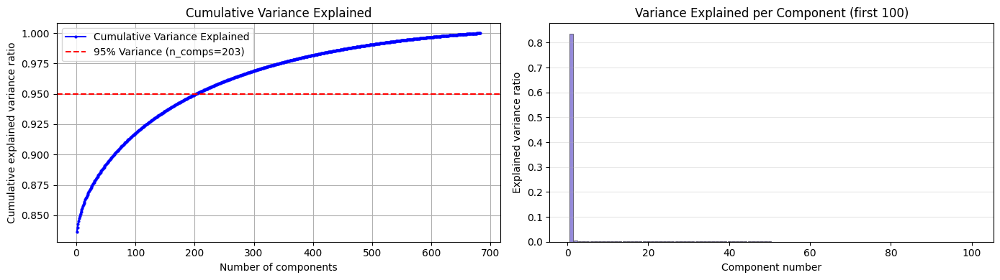

In [12]:
Y = sc_train_matrices.T # d by n
B, C, variance_explained, cumulative_variance_explained = fit_pca(Y)
plot_pca_variance(variance_explained, cumulative_variance_explained)

In the d by n case, PCA constructs an orthonormal basis of the data (B of shape n by k) capturing the principal directions of variance in the subjects across edges. In this setting the first principal component captures a disproportionate amount of variance across edges, which may point to a simple low rank structure of connectome structure in the population. Given prior knowledge that connectomes are highly similar to each other, we visualize the weights of the first PC to observe the loading structure on the subjects.

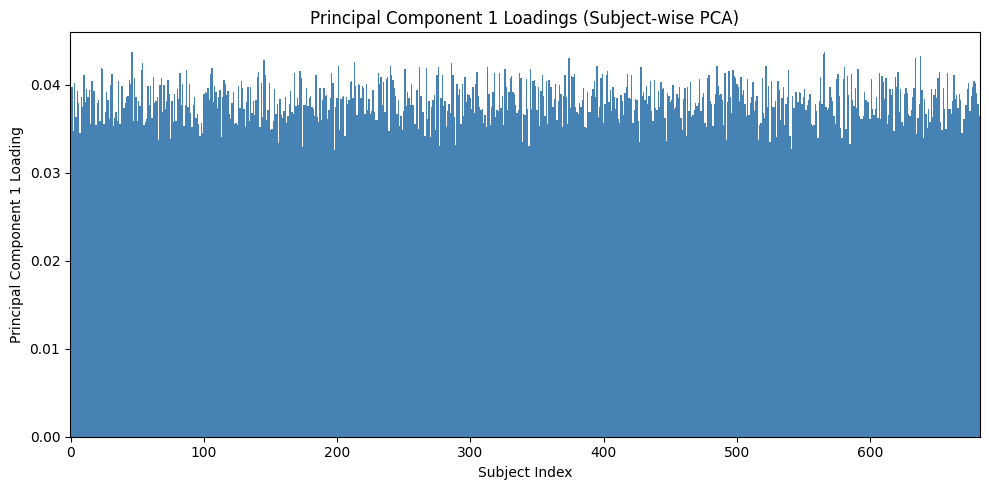

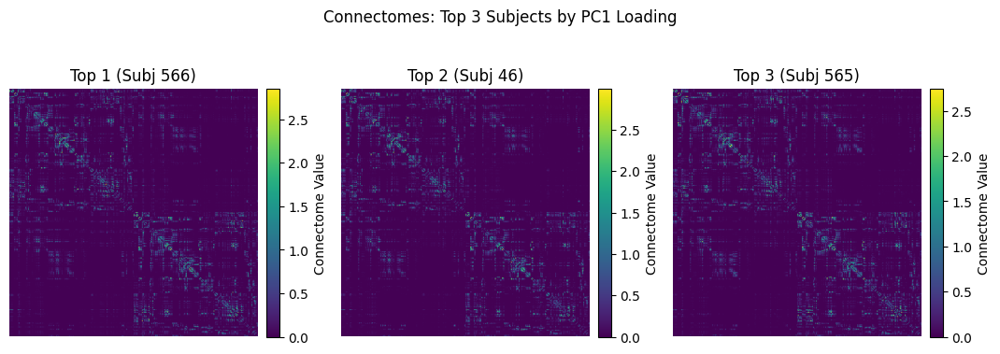

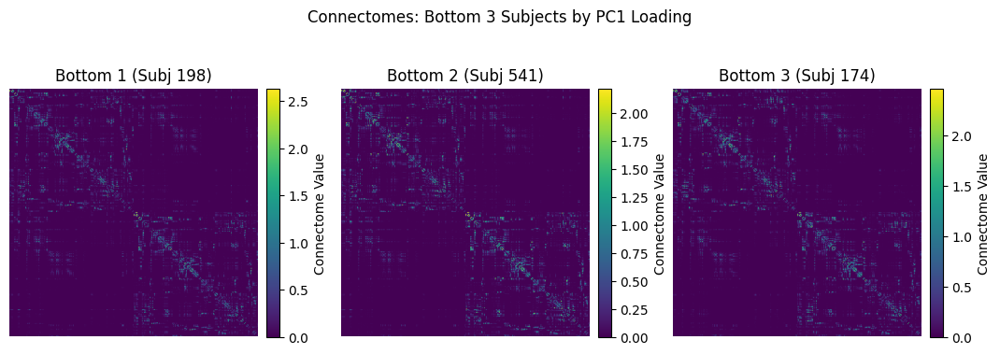

In [13]:
plot_pc_loadings_and_connectomes(
    B=B, 
    connectome_type="sc",
    train_matrices=sc_train_matrices,
    tri2square=tri2square, 
    tri_indices=sc_tri_indices, 
    pc_to_observe=0,  # You may change this value
    n_display=3       # You may change this value
)

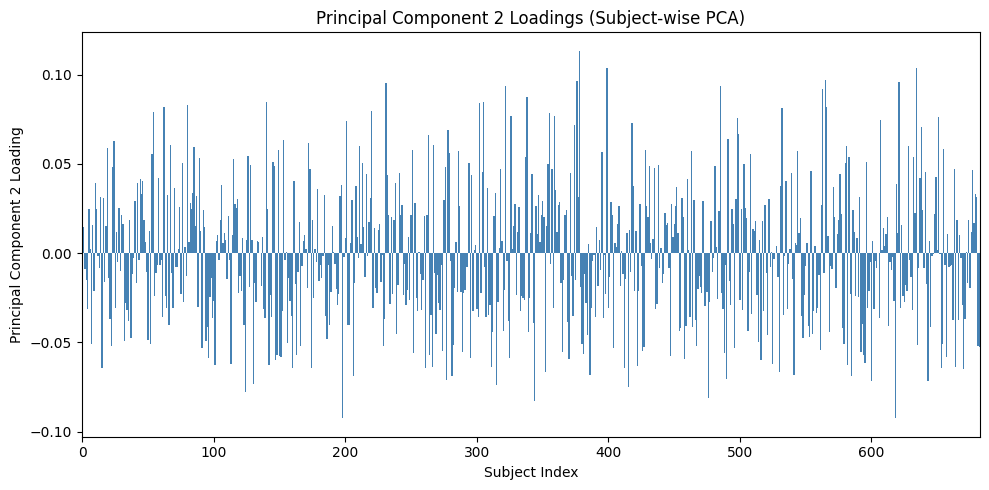

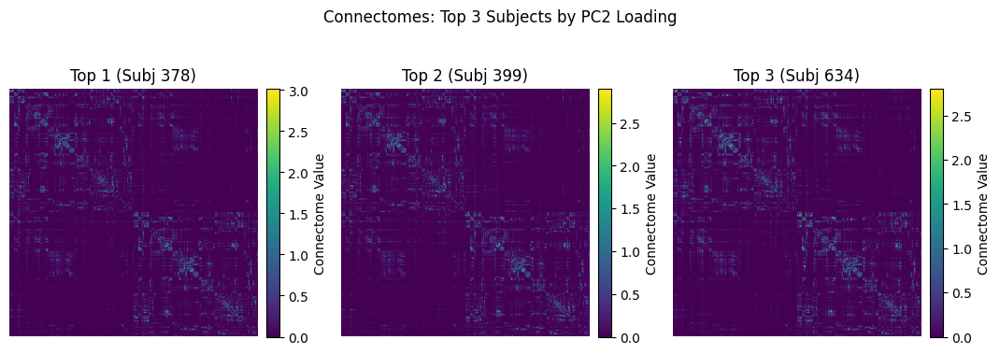

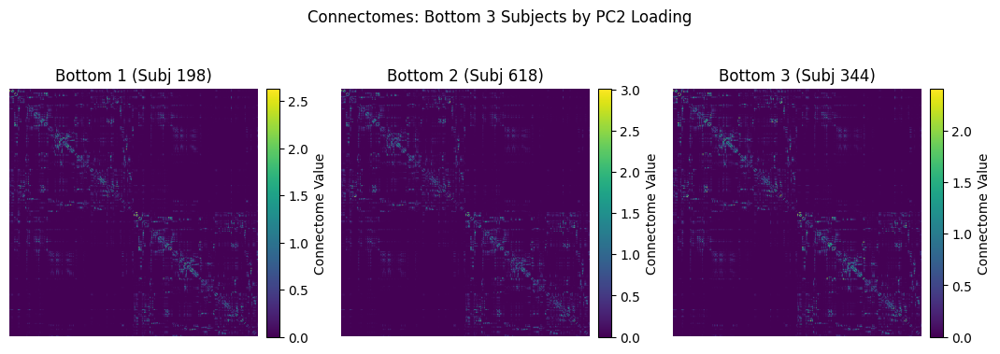

In [14]:
plot_pc_loadings_and_connectomes(
    B=B, 
    connectome_type="sc",
    train_matrices=sc_train_matrices,
    tri2square=tri2square, 
    tri_indices=sc_tri_indices, 
    pc_to_observe=1,  # You may change this value
    n_display=3       # You may change this value
)

### FC

edge-wise

X.shape: (683, 64620)
B.shape: (683, 64620)
B orthonormal: True
C.shape: (683, 683)


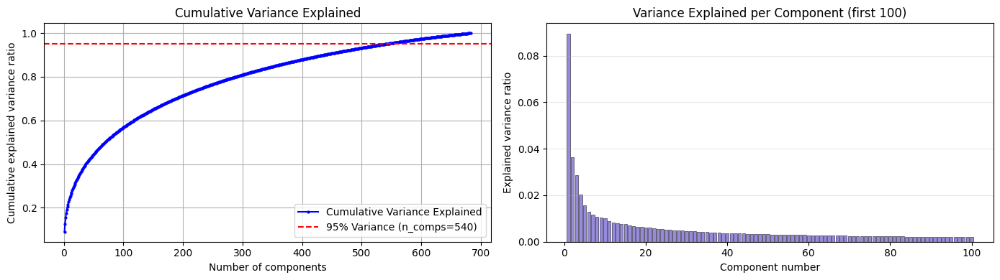

In [15]:
X = fc_train_matrices # n by d
B, C, variance_explained, cumulative_variance_explained = fit_pca(X)
plot_pca_variance(variance_explained, cumulative_variance_explained)

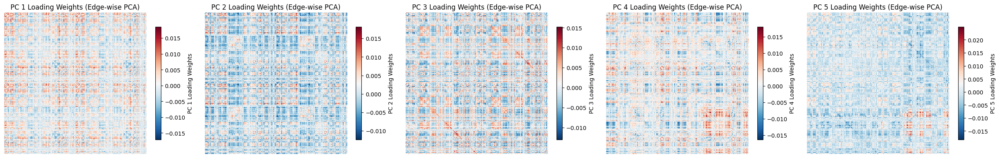

In [16]:
# Visualize the first num_pcs PC loadings as square matrices
num_pcs = 5  # Change this value as desired (e.g., 5, 10, etc.)
plt.figure(figsize=(5 * num_pcs, 5))

for i in range(num_pcs):
    pc = B[i, :]
    pc_matrix = tri2square(pc, tri_indices=sc_tri_indices)
    ax = plt.subplot(1, num_pcs, i + 1)
    im = ax.imshow(pc_matrix, cmap='RdBu_r')
    cbar = plt.colorbar(im, ax=ax, label=f"PC {i+1} Loading Weights", shrink=0.6)
    ax.set_title(f"PC {i+1} Loading Weights (Edge-wise PCA)")
    ax.axis("off")

plt.tight_layout()
plt.show()

subject-wise

X.shape: (64620, 683)
B.shape: (683, 683)
B orthonormal: True
C.shape: (64620, 683)


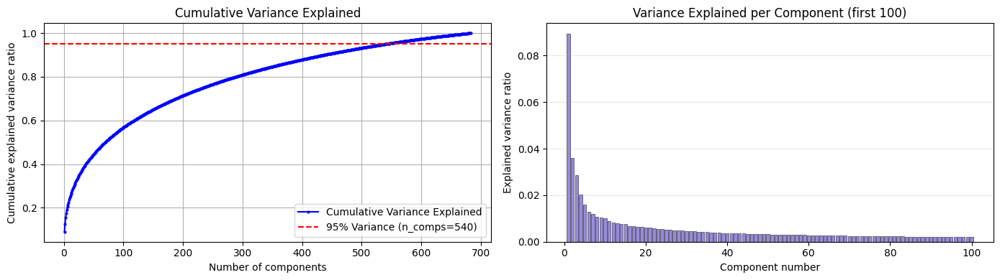

In [17]:
Y = (fc_train_matrices - fc_train_avg).T # d by n
B, C, variance_explained, cumulative_variance_explained = fit_pca(Y)
plot_pca_variance(variance_explained, cumulative_variance_explained)

In [18]:
first_pc.shape

(64620,)

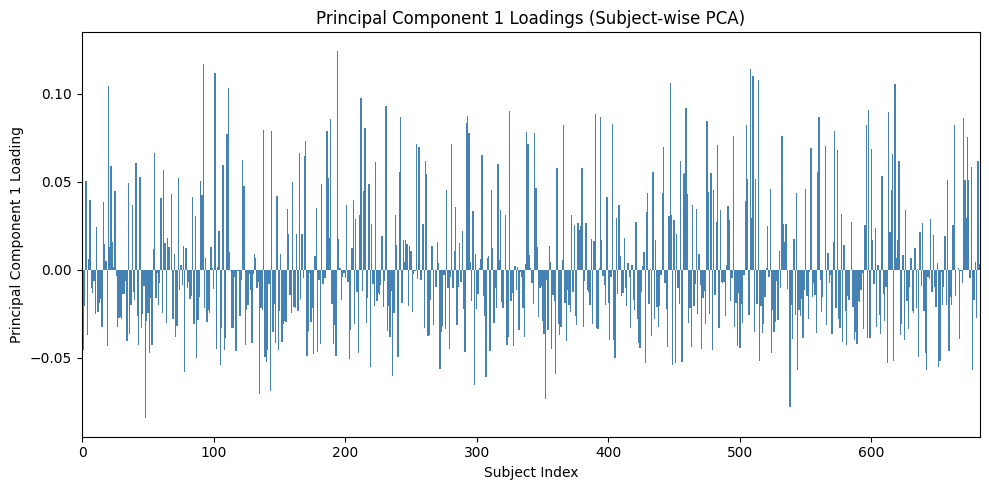

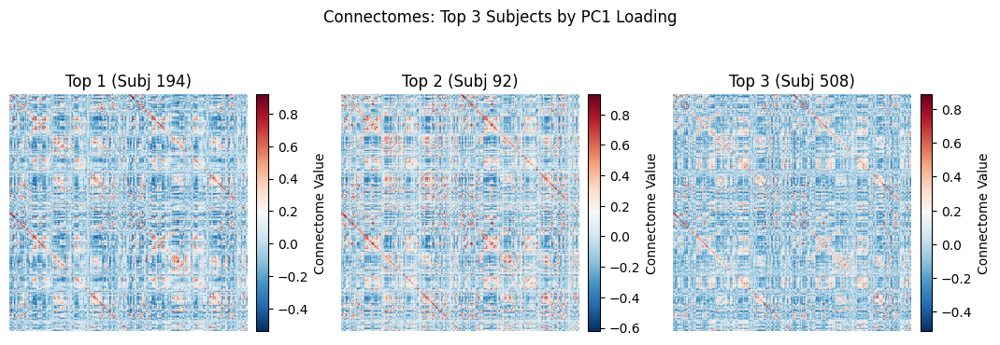

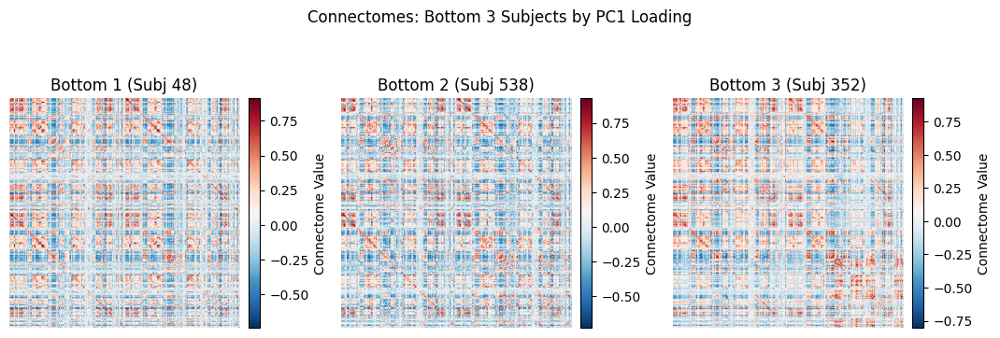

In [19]:
plot_pc_loadings_and_connectomes(
    B=B,
    connectome_type="fc",
    train_matrices=fc_train_matrices, 
    tri2square=tri2square, 
    tri_indices=sc_tri_indices, 
    pc_to_observe=0,  # You may change this value
    n_display=3       # You may change this value
)


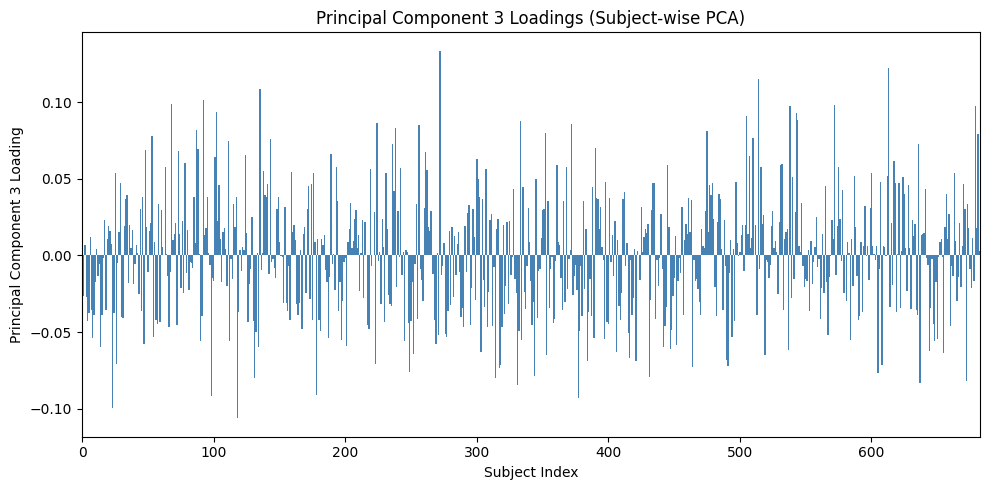

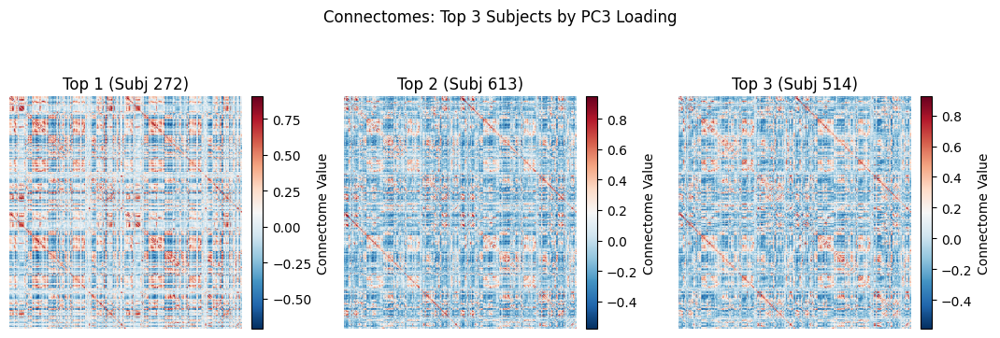

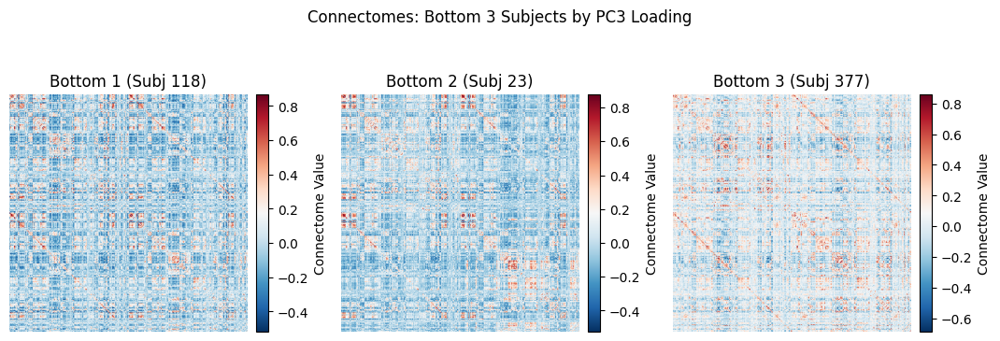

In [20]:
plot_pc_loadings_and_connectomes(
    B=B,
    connectome_type="fc",
    train_matrices=fc_train_matrices, 
    tri2square=tri2square, 
    tri_indices=sc_tri_indices, 
    pc_to_observe=2,  # You may change this value
    n_display=3       # You may change this value
)

# could also look at this deflated by previous PCs

<Figure size 1000x1000 with 0 Axes>

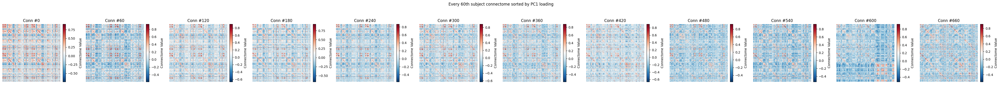

In [21]:
# take every 60th connectome and plot it in a row so that we can see variation for every 60th connectome

# sort all the connectomes by the PC1 loadings
sorted_idx = np.argsort(B[0, :])
every60th_pc1_connectome= [fc_train_matrices[i, :] for i in sorted_idx[::60]]
# plot the average of these connectomes
plt.figure(figsize=(10, 10))

n_connectomes = len(every60th_pc1_connectome)
fig, axes = plt.subplots(1, n_connectomes, figsize=(3.6 * n_connectomes, 4), constrained_layout=False)
if n_connectomes == 1:
    axes = [axes]
for i, subj_idx in enumerate(range(n_connectomes)):
    connectome = every60th_pc1_connectome[subj_idx]
    # Use the reference code: pass tri_indices explicitly (sc_tri_indices)
    conn_mat = tri2square(connectome, tri_indices=sc_tri_indices)
    im = axes[i].imshow(conn_mat, aspect='equal', cmap='RdBu_r')
    axes[i].set_title(f"Conn #{subj_idx*60}", fontsize=12)
    axes[i].axis("off")
    divider = make_axes_locatable(axes[i])
    cax = divider.append_axes("right", size="5%", pad=0.10)
    cbar = plt.colorbar(im, cax=cax, label="Connectome Value")
fig.suptitle(f"Every 60th subject connectome sorted by PC1 loading")
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()

Possible explanation: Much of the variance in the population is driven by some global scaling factor likely driven by systematic fluctuations in the range/magnitude of connectomes. This global PC explains a disproportionately large amount of variance over edges between subjects.

### Edge-wise PCA as an autoencoder (how much info loss?)

Loadings shape (n_components, n_features): (683, 64620)
Train scores shape (n_train_samples, n_components): (683, 683)


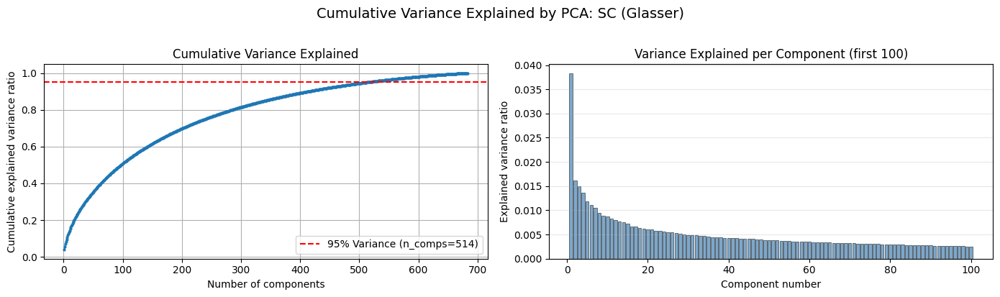

128 components: Train R^2: 0.40679  Val R^2: 0.06451  Test R^2: 0.10323
256 components: Train R^2: 0.59351  Val R^2: 0.01677  Test R^2: 0.07877
512 components: Train R^2: 0.86376  Val R^2: -0.11515  Test R^2: -0.01398


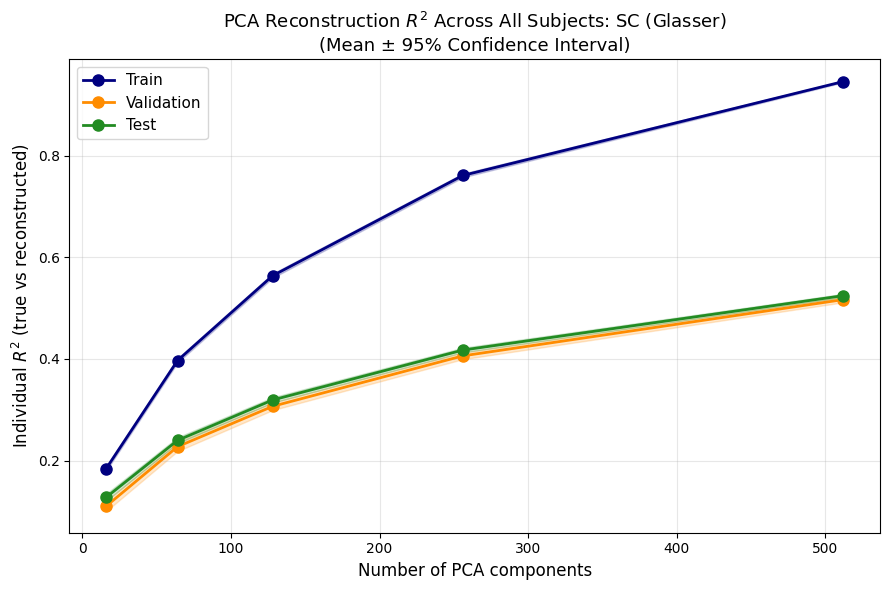

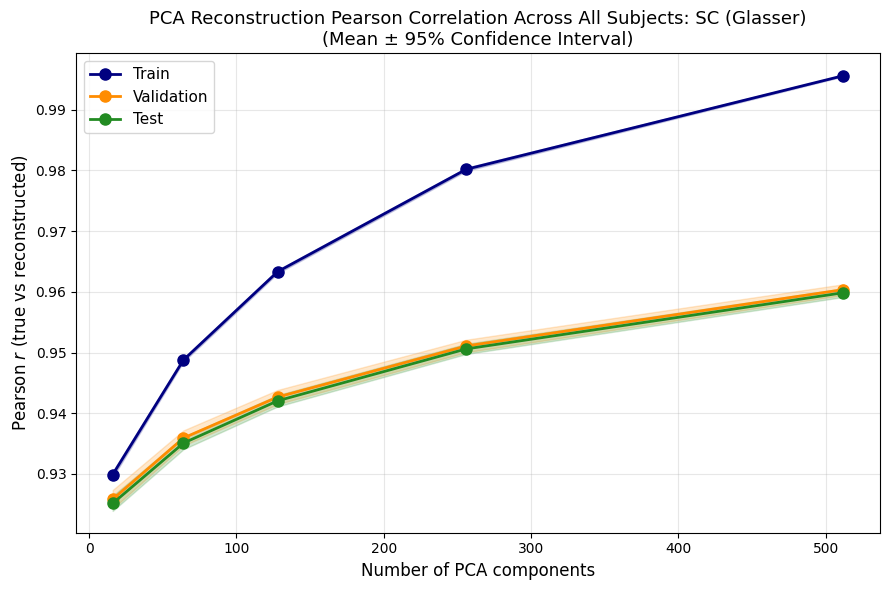

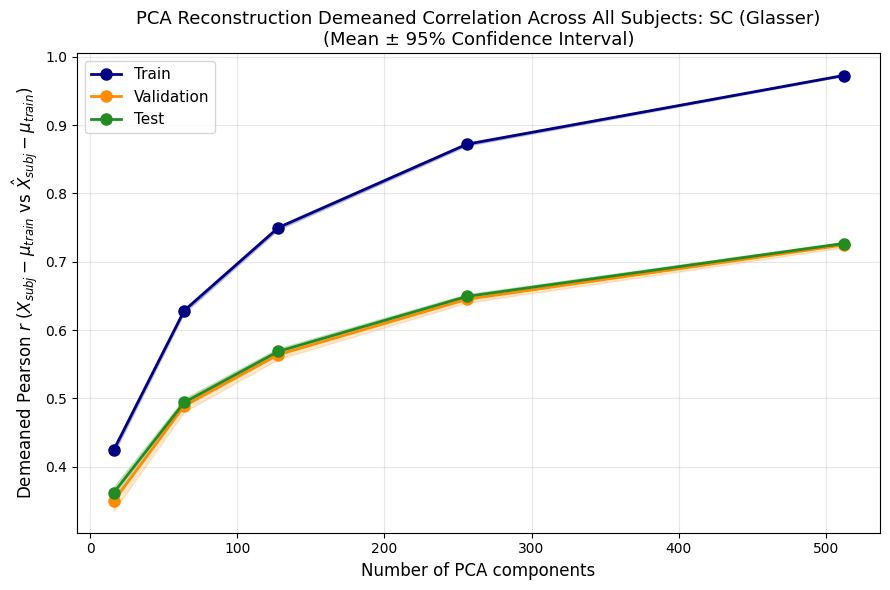

In [22]:
pca, scores_dict, loadings = run_pca_and_plot(
    sc_train_matrices, sc_val_matrices, sc_test_matrices,
    train_ids=HCP_Dataset.trainvaltest_partition_indices["train"], 
    val_ids=HCP_Dataset.trainvaltest_partition_indices["val"], 
    test_ids=HCP_Dataset.trainvaltest_partition_indices["test"],
    modality="SC", parcellation="Glasser")

Loadings shape (n_components, n_features): (683, 64620)
Train scores shape (n_train_samples, n_components): (683, 683)


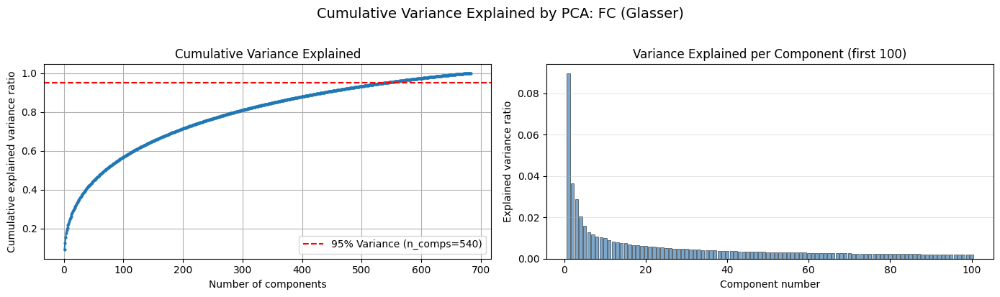

128 components: Train R^2: 0.58634  Val R^2: 0.36337  Test R^2: 0.36033
256 components: Train R^2: 0.74633  Val R^2: 0.41184  Test R^2: 0.40817
512 components: Train R^2: 0.92892  Val R^2: 0.45751  Test R^2: 0.45412


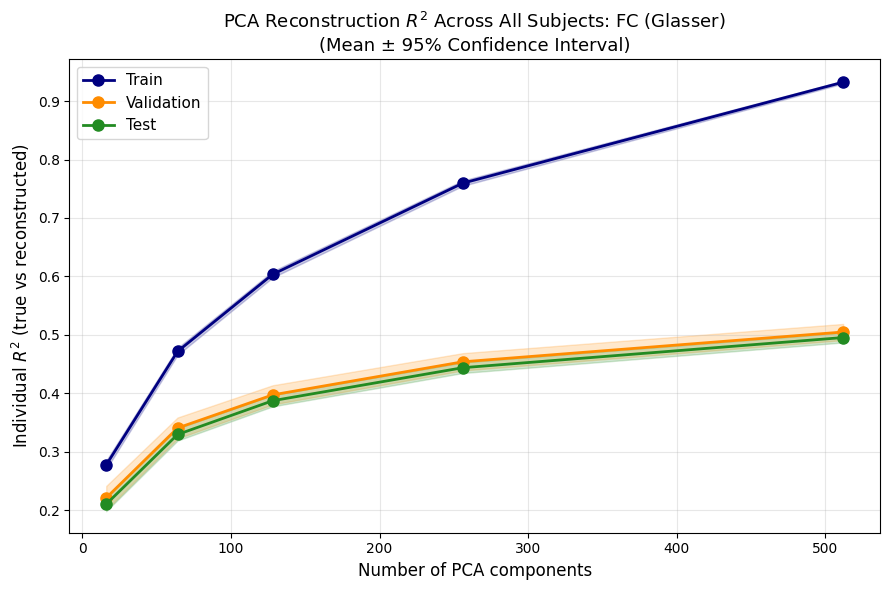

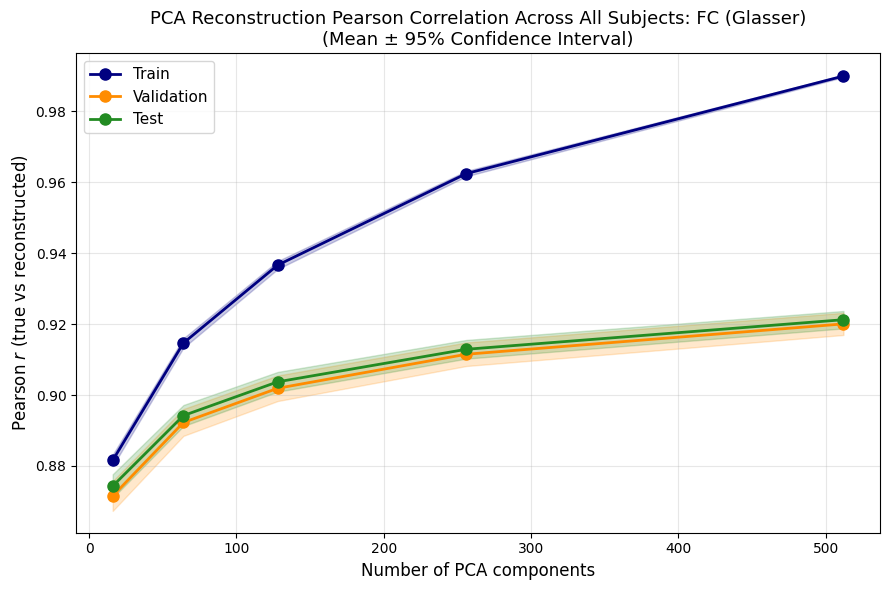

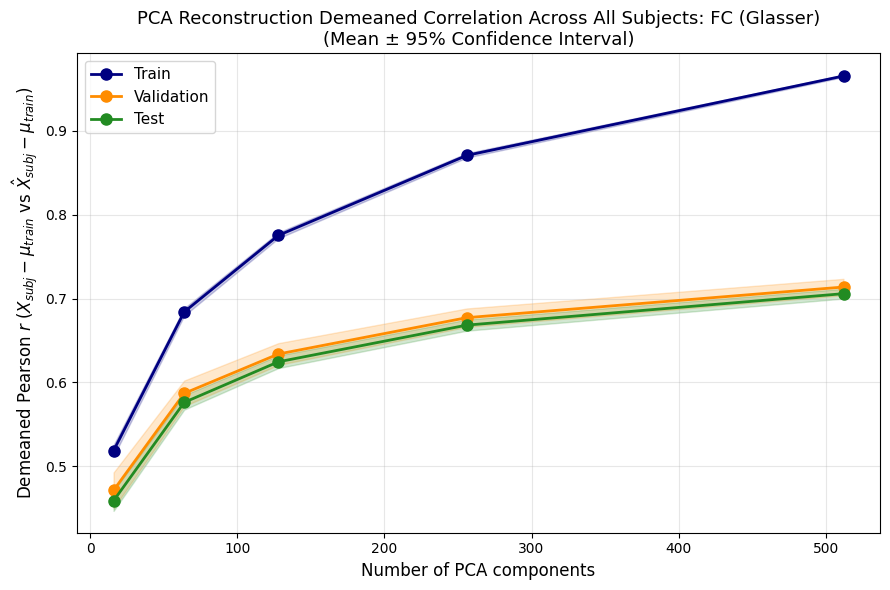

In [23]:
pca, scores_dict, loadings = run_pca_and_plot(
    fc_train_matrices, fc_val_matrices, fc_test_matrices,
    train_ids=HCP_Dataset.trainvaltest_partition_indices["train"], 
    val_ids=HCP_Dataset.trainvaltest_partition_indices["val"], 
    test_ids=HCP_Dataset.trainvaltest_partition_indices["test"],
    modality="FC", parcellation="Glasser")